# AlexNet Implementation - Train on ImageNet 2012


Please download the ImageNet dataset from the above link. There are two methods to get the dataset. One is the 
official image-net website but users may need an college student indntity and complex application procedure. 
And another (both simple and practical) method is to download from the public resources. 

## 1.ImageNet Official Website for College Users: 

    https://image-net.org/download-images
 
## 2.Academictorrents Website for Other Users: 

    https://academictorrents.com/
 
The original name of ImageNet dataset is ILSVRC2012. Users can change the name to imagenet2012 or keep it no 
changed. Principlly, users can use the dataset up to ILVVRC2017 that is the last iamge recognition benchmark 
competition [https://image-net.org/challenges/LSVRC/2017/] in the history. 
 
 ```
 imagenet2012/
     ├── ILSVRC2012_img_test.tar
     ├── ILSVRC2012_img_train.tar
     └── ILSVRC2012_img_val.tar
 ```
 
Create another folder and create the folders `data`, `download` & `extracted` like shown:
 ```
  datasets/
     └──imagenet/
            ├── data/
            ├── downloaded/
            └── extracted/  
 ```

In [1]:
import os

os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "1"

import tensorflow as tf
import tensorflow_addons as tfa
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
from pprint import pprint

plt.rcParams["figure.figsize"] = 30, 30

/home/mike/miniconda3/lib/python3.9/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/home/mike/miniconda3/lib/python3.9/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/home/mike/miniconda3/lib/python3.9/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/home/mike/miniconda3/lib/python3.9/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/home/mike/miniconda3/lib/python3.9/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/home/mike/miniconda3/lib/python3.9/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data11DatasetBase8Fina

# ImageNet Data Loader

In [2]:
# Constants 

image_dims = (227, 227)
num_classes = 1000
NUM_CLASSES = num_classes
BATCH_SIZE = None
NUM_CHANNELS = 3
AUTOTUNE = tf.data.experimental.AUTOTUNE
HEIGHT, WIDTH  = image_dims

In [3]:
# Data Processing 

import tensorflow as tf

def preprocess_image(image, label):
    """
    Process the image and label to perform the following operations:
    - Min-Max scale the image divided by 255
    - Convert the numerical values of the lables to one-hot encoded format
    - Resize the image to (227, 227)
    Args:
        image(image tensor): Raw image
        label(tensor): Numeric labels 1, 2, 3, ...
    Returns:
        tuple: Scaled image, one-hot encoded label
    """
    # Change the tf.unint8 into tf.float32 in the code of AlexNet model.  
    image = tf.cast(image, tf.uint8)
    image = tf.image.resize(image, [HEIGHT, WIDTH])
    image = image / tf.math.reduce_max(image)
    label = tf.one_hot(indices=label, depth=NUM_CLASSES)

    return image, label


@tf.function
def augment_batch(image, label):
    """
    Image augmentation for training:
    - Random Contrast
    - Random Brightness
    - Random Hue(Color)
    - Random Saturation
    - random Flip Left Right
    - Random Jpeg Quality
    Args:
        image(Tensor Image): Raw Image
        label(Tensor): Numeric Labels 1, 2, 3, ...
    Returns:
        tuple: Augmented image, numeric labels 1, 2, 3, ...
    """
    if tf.random.normal([1]) < 0:
        image = tf.image.random_contrast(image, 0.2, 0.9)
    if tf.random.normal([1]) < 0:
        image = tf.image.random_brightness(image, 0.2)
    if NUM_CHANNELS == 3 and tf.random.normal([1]) < 0:
        image = tf.image.random_hue(image, 0.3)
    if NUM_CHANNELS == 3 and tf.random.normal([1]) < 0:
        image = tf.image.random_saturation(image, 0, 15)
    
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_jpeg_quality(image, 10, 100)

    return image, label

In [4]:
# Load the ImageNet2012 dataset

class DataLoader:


    def __init__(self, source_dir, dest_dir, split="train"):
        """
        - Instance variable initialization
        - Download and set up the dataset with one-off operation
        - Use the TensorFlow tfds to Load and convert the ImageNet Dataset
        Args:
            source_dir(str): Path to downloaded tar files
            dest_dir(str): Path to the location where the dataset will be unpacked
            split(str): Split data for example with[80%:20%], defaulted as "train"
        """  
        # Download the Config(see tfds reference)
        download_config = tfds.download.DownloadConfig(
            extract_dir=os.path.join(dest_dir, 'extracted'), 
            manual_dir=source_dir)

        # download_and_prepare() is a method under tfds.core.DatasetBuilder
        download_and_prepare_kwargs = {
            'download_dir': os.path.join(dest_dir, 'downloaded'),
            'download_config': download_config}

        # TFDS Data Loader with performing dataset conversion to TFRecord
        self.ds, self.ds_info = tfds.load(
            'imagenet2012', 
            # for the following big TFRecord data
            data_dir=os.path.join(dest_dir, 'data'),  
            # Load the designated dataset such as "train", "test" of ["train", "test"]
            split=split, 
            shuffle_files=True,  
            # Convert the ImageNet data into TFRecord and save it into data directory. If set it 
            # to False, it does not execute the method: builder.download_and_prepare().
            download=True, # If False, data is expected to be in data_dir
            # Set it to True for saving each piece of 2-tuple data:(input,label); or set if to False 
            # for saving it as dict type such as {feature1:input, feature:label}. 
            as_supervised=True,
            # Set it to True for returning a tuple (tf.data.Dataset,tfds.core.DatasetInfo) or set it
            # to Flase for returning as a tf.data.Dataset object. 
            with_info=True,
            # Set it to True for passing kwargs to tfds.core.DatasetBuilder.download_and_prepare.
            download_and_prepare_kwargs=download_and_prepare_kwargs)


    def dataset_generator(self, batch_size=32, augment=False):
    # def dataset_generator(self, batch_size=32, augment_args=False):
        """
        Create the data loader pipeline and return a generator to generate datsets
        Args:
            batch_size(int, optional): Batch size defaulted to 32.
            augment(bool, optional): Enable/Disable augmentation defaulted to False.
        Returns:
            Tf.Data Generator: Dataset generator
        """
        BATCH_SIZE = batch_size

        dataset = self.ds.apply(tf.data.experimental.ignore_errors())
        dataset = dataset.shuffle(batch_size * 10)
        dataset = dataset.repeat()
          
        if augment:
            dataset = dataset.map(augment_batch, num_parallel_calls=AUTOTUNE)
        
        dataset = dataset.map(preprocess_image, num_parallel_calls=AUTOTUNE)
        dataset = dataset.batch(batch_size)
        dataset = dataset.prefetch(buffer_size=AUTOTUNE)

        return dataset


    def get_dataset_size(self):
        """
        get_dataset_size
        Get the dataset size(number of images)
        Returns:
            int: Total number of images in the dataset
        """
        
        return len(self.ds)
    

    def get_num_steps(self):
        """
        Get the number of steps required per batch for training
        Raises:
            AssertionError: Dataset generator needs to be initialized first
        Returns:
            int: Number of steps required for training per batch
        """
        if BATCH_SIZE is None:

            raise AssertionError(
                f"Batch Size is not Initialized. Call this method only after calling: {self.dataset_generator}"
            )  
        num_steps = self.get_dataset_size() // BATCH_SIZE + 1

        return num_steps
    

    def visualize_batch(self, augment=True):
        """
        Dataset sample visualization
        - Support augmentation
        - Automatically adjust for grayscale images
        Args:
            augment(bool, optional): Enable/Disable augmentation defaulted to True.
        """
        if NUM_CHANNELS == 1:
            cmap = "gray"
        else:
            cmap = "viridis"

        dataset = self.dataset_generator(batch_size=36, augment=augment)
        image_batch, label_batch = next(iter(dataset))
        image_batch, label_batch = (image_batch.numpy(), label_batch.numpy(),)

        for n in range(len(image_batch)):
            ax = plt.subplot(6, 6, n + 1)
            plt.imshow(image_batch[n], cmap=cmap)
            plt.title(np.argmax(label_batch[n]))
            plt.axis("off")

        plt.show() 

In [5]:
data_loader = ImageNetDataLoader(
        source_dir = "/media/drive1/ImageNet2012",
        dest_dir = "/media/drive1/imdata/imagenet",
        split = "train",
)

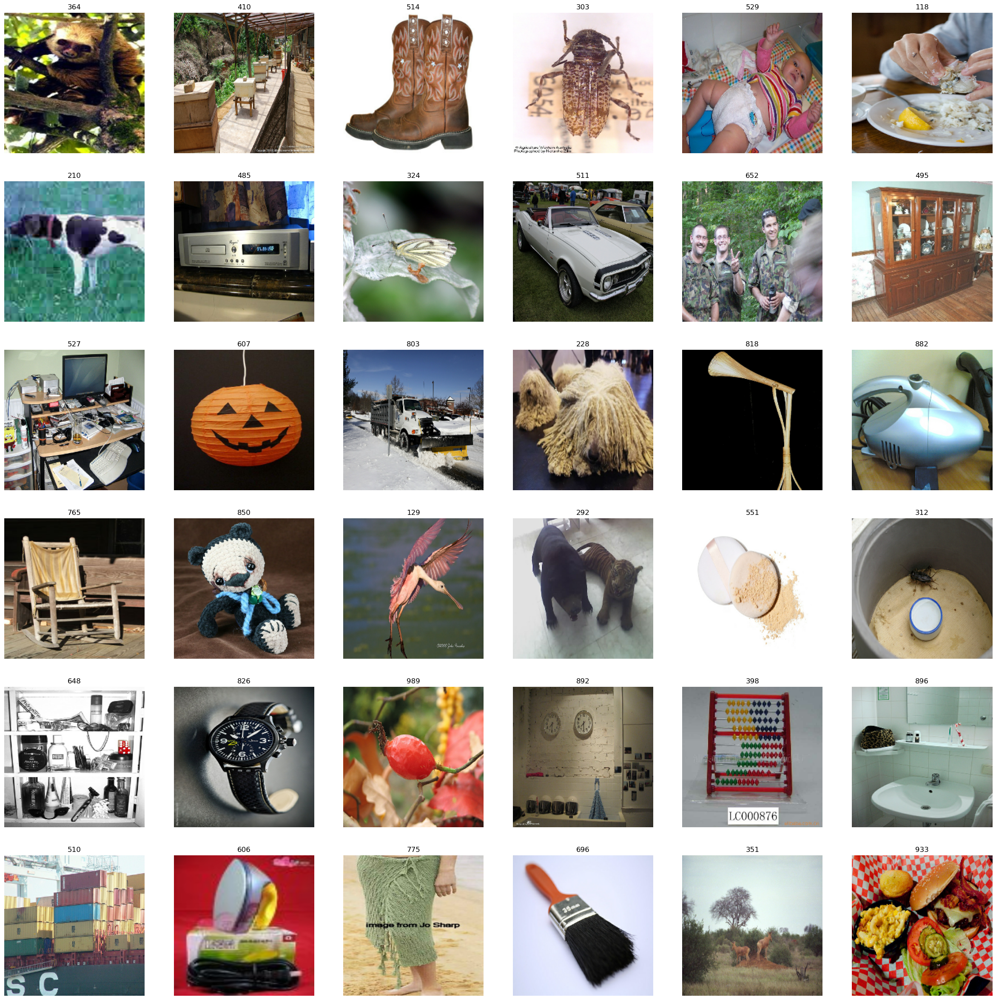

In [6]:
data_loader.visualize_batch(augment=False)

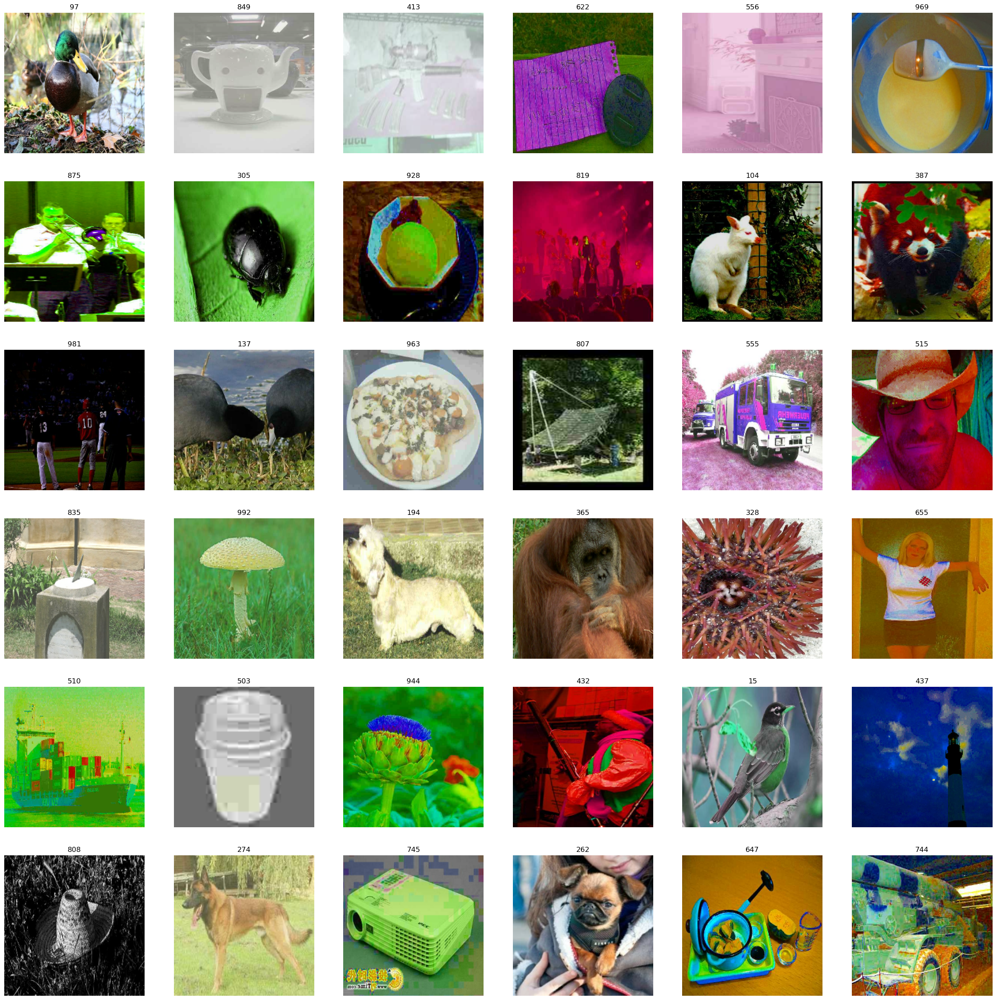

In [7]:
data_loader.visualize_batch(augment=True)

# AlexNet Architecture - Single GPU

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 alexnet_input (InputLayer)  [(None, 227, 227, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 57, 57, 96)        34944     
                                                                 
 batch_normalization (BatchN  (None, 57, 57, 96)       384       
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 57, 57, 96)        0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 28, 28, 96)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 28, 28, 256)       614656

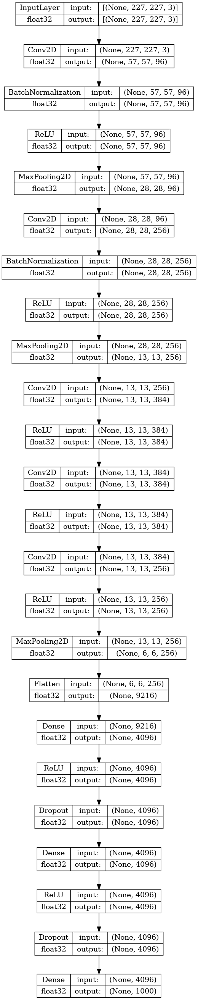

In [8]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras import Input
from tensorflow.keras.layers import Conv2D, BatchNormalization, ReLU, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.utils import plot_model

inputs = Input(shape=(227,227,3), name="alexnet_input")

# Layer 1    
x = Conv2D(96, (11,11), strides=4, padding="same")(inputs)
x = BatchNormalization()(x)
x = ReLU()(x)
x = MaxPooling2D((3,3), strides=2)(x)

# Layer 2
x = Conv2D(256, (5,5), strides=1, padding='same')(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = MaxPooling2D((3,3), strides=2)(x)

# Layer 3
x = Conv2D(384, (3,3), strides=1, padding='same')(x)
x = ReLU()(x)

# Layer 4
x = Conv2D(384, (3,3), strides=1, padding='same')(x)
x = ReLU()(x)

# Layer 5
x = Conv2D(256, (3,3), strides=1, padding='same')(x)
x = ReLU()(x)
x = MaxPooling2D((3,3), strides=2)(x)

# Layer 6
x = Flatten()(x)
x = Dense(4096)(x)
x = ReLU()(x)
x = Dropout(rate=0.5)(x)

# Layer 7
x = Dense(4096)(x)
x = ReLU()(x)
x = Dropout(rate=0.5)(x)

# Layer 8
outputs = Dense(1000, activation='softmax', dtype=tf.float32, name="alexnet_output")(x)

alexnet = Model(inputs=inputs, outputs=outputs)

alexnet.summary()

tf.keras.utils.plot_model(alexnet, show_layer_names=False, show_shapes=True, show_dtype=True)

# Training Callbacks
- Early Stopping - Stop Training if Validation Accuracy Stops Increasing
- Model Checkpoint - Save Model Weights (Model) if Validation Accuracy improves
- Tensorboard - Log the Training and Validation Metrics on Tensorboard for Training Analysis

In [9]:
# Callbacks

my_callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=2),
    tf.keras.callbacks.ModelCheckpoint(filepath="weights/alexnet.{epoch:02d}-{val_categorical_accuracy:.2f}-{val_loss:.2f}.h5"),
    tf.keras.callbacks.TensorBoard(log_dir='./logs'),
]

# Training and Validation Metrics

## Legend:
- TP - True Positive
- FP - False Positive
- TN - True Negative
- FN - False Negative

## Metrices:
- Categorical Accuracy = $\frac{TP+FP}{TP+FP+TN+FN}$
- Precision = $\frac{TP}{TP+FP}$
- Recall = $\frac{TP}{TP+FN}$
- F1 Score = $2*\frac{Precision*Recall}{Precision+Recall}$

In [10]:
# Metrics
metrics = [
    tf.keras.metrics.CategoricalAccuracy(),
    tf.keras.metrics.FalseNegatives(),
    tf.keras.metrics.FalsePositives(),
    tf.keras.metrics.Precision(),
    tf.keras.metrics.Recall(),
    tfa.metrics.F1Score(num_classes=1000)
]

# Mixed Precision Training

Enable Mixed Precision Training for Supported GPUs to utilize the optimized Tensor Cores for Matrix Operations. 

In [11]:
# Mixed Precision
tf.keras.mixed_precision.set_global_policy("mixed_float16")

The dtype policy mixed_float16 may run slowly because this machine does not have a GPU. Only Nvidia GPUs with compute capability of at least 7.0 run quickly with mixed_float16.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


The dtype policy mixed_float16 may run slowly because this machine does not have a GPU. Only Nvidia GPUs with compute capability of at least 7.0 run quickly with mixed_float16.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


# Initialize Data Loader for Training and Validation

In [12]:
# Constants
BATCH_SIZE = 512

# Init Data Loaders
train_data_loader = ImageNetDataLoader(
        source_dir = "/media/drive1/ImageNet2012",
        dest_dir = "/media/drive1/imdata/imagenet",
        split = "train",
)

val_data_loader = ImageNetDataLoader(
        source_dir = "/media/drive1/ImageNet2012",
        dest_dir = "/media/drive1/imdata/imagenet",
        split = "validation",
)

train_generator = train_data_loader.dataset_generator(batch_size=BATCH_SIZE, augment=False)
val_generator = val_data_loader.dataset_generator(batch_size=BATCH_SIZE, augment=False)

train_steps = train_data_loader.get_num_steps()
val_steps = val_data_loader.get_num_steps()

# Compile Model and Start Training

In [13]:
# Constants
# EPOCHS = 200
EPOCHS = 5

# Compile & Train
alexnet.compile(
    loss=tf.keras.losses.CategoricalCrossentropy(),
    optimizer=tf.keras.optimizers.SGD(
        learning_rate=0.01, momentum=0.9, nesterov=False, name='SGD'
    ),
    metrics=metrics,
)

history = alexnet.fit(
    epochs=EPOCHS,
    x=train_generator,
    steps_per_epoch=train_steps,
    validation_data=val_generator,
    validation_steps=val_steps,
    callbacks=my_callbacks
)

2503/2503 [==============================] - 20684s 8s/step - loss: 6.0156 - categorical_accuracy: 0.0317 - false_negatives: 1279796.0000 - false_positives: 1388.0000 - precision: 0.5563 - recall: 0.0014 - f1_score: 0.0250 - val_loss: 5.4905 - val_categorical_accuracy: 0.0616 - val_false_negatives: 49941.0000 - val_false_positives: 163.0000 - val_precision: 0.5905 - val_recall: 0.0047 - val_f1_score: 0.0453
